In [ ]:
# Import the required python libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.ensemble import HistGradientBoostingClassifier, RandomForestClassifier
from sklearn.metrics import f1_score,confusion_matrix,recall_score,accuracy_score,precision_score
import time

In [ ]:
# making sure the sklearn is in version 1.1.3
import sklearn
print(sklearn.__version__)

1.0.2


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data=pd.read_sas('/content/drive/MyDrive/datasets/BRFSS 2021 Dataset/LLCP2021XPT/LLCP2021.XPT')

/usr/local/lib/python3.8/dist-packages/pandas/io/sas/sas_xport.py:475: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  df[x] = v


In [ ]:
# The data has majorly float64 and string type data entries
data.dtypes.unique()

array([dtype('float64'), dtype('O')], dtype=object)

In [ ]:
# The data has a total of 303 varibles and 438693 entries
data.shape

(438693, 303)

In [ ]:
#It describes the genders included in the creation of the dataset 
data['_SEX'].unique()

array([2., 1.])

In [ ]:
data.columns[:30]

Index(['_STATE', 'FMONTH', 'IDATE', 'IMONTH', 'IDAY', 'IYEAR', 'DISPCODE',
       'SEQNO', '_PSU', 'CTELENM1', 'PVTRESD1', 'COLGHOUS', 'STATERE1',
       'CELPHON1', 'LADULT1', 'COLGSEX', 'NUMADULT', 'LANDSEX', 'NUMMEN',
       'NUMWOMEN', 'RESPSLCT', 'SAFETIME', 'CTELNUM1', 'CELLFON5', 'CADULT1',
       'CELLSEX', 'PVTRESD3', 'CCLGHOUS', 'CSTATE1', 'LANDLINE'],
      dtype='object')

In [ ]:
# It includes the FIPS code for each state
# FIPS code is something which uniquely identifies each geographical area
data['_STATE'].unique()

array([ 1.,  2.,  4.,  5.,  6.,  8.,  9., 10., 11., 13., 15., 16., 17.,
       18., 19., 20., 21., 22., 23., 24., 25., 26., 27., 28., 29., 30.,
       31., 32., 33., 34., 35., 36., 37., 38., 39., 40., 41., 42., 44.,
       45., 46., 47., 48., 49., 50., 51., 53., 54., 55., 56., 66., 72.,
       78.])

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


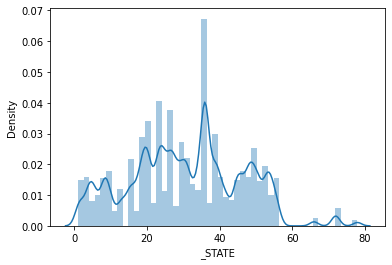

In [ ]:
sns.distplot(data['_STATE'],kde=True)

In [ ]:
# Pretty much the months in a year
data['FMONTH'].unique()

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.])

In [ ]:
# Interview completed (1100) or not (1200)
data['DISPCODE'].unique()

array([1100., 1200.])

In [ ]:
# This describes the health status in diferent levels (Page 19)
data['GENHLTH'].unique()

array([ 5.,  3.,  2.,  4.,  1.,  7., nan,  9.])

In [ ]:
# Number of days in past 30 days, your physical health was not good. (Page 20)
data['PHYSHLTH'].unique()

array([20., 88., 30., 25.,  7., 77.,  1., 10.,  4.,  2.,  3., 15.,  8.,
       13., 14.,  5.,  6., 17., 22., nan, 12., 21., 24., 29., 18., 11.,
       99.,  9., 16., 26., 28., 23., 27., 19.])

In [ ]:
# Number of days in past 30 days, your Mental health was not good. (Page 20)
data['MENTHLTH'].unique()

array([10., 88.,  5., 25., 15., 77., 14.,  2.,  3.,  7.,  1., 30., 20.,
        8.,  4., nan, 99., 21., 28., 24.,  6., 12., 22., 27.,  9., 18.,
       13., 17., 16., 19., 29., 11., 23., 26.])

In [ ]:
# Health conditions stopped you from doing your regular routine (Page 21)
data['POORHLTH'].unique() 

array([88., nan, 30.,  2.,  5., 20., 10.,  1., 15.,  3.,  7., 77.,  6.,
       25.,  4., 12., 21., 14.,  8., 99., 17., 19., 16., 24.,  9., 27.,
       28., 13., 29., 22., 26., 18., 11., 23.])

In [ ]:
# kind of health Insurance the person holds (Page 22) 
data['PRIMINSR'].unique()

array([ 3.,  1.,  2., 99., 10., 88.,  5.,  7., 77.,  9., nan,  4.,  8.,
        6.])

In [ ]:
# Number of healthcare providers a person has (Page 23)
data['PERSDOC3']

0         1.0
1         2.0
2         2.0
3         1.0
4         1.0
         ... 
438688    3.0
438689    1.0
438690    1.0
438691    2.0
438692    2.0
Name: PERSDOC3, Length: 438693, dtype: float64

In [ ]:
# was there a time in past 12 months, where you wanted but could not see a doc ? (Page 23)
data['MEDCOST1'].unique()

array([ 2.,  1.,  7., nan,  9.])

In [ ]:
# Last routine checkup
data['CHECKUP1'].unique()

array([ 2.,  1.,  4.,  3., nan,  7.,  8.,  9.])

In [ ]:
# Did you exercise in past 30 days
data['EXERANY2'].unique()

array([ 2.,  1., nan,  7.,  9.])

In [ ]:
# Marital Status (Page 36)
data['MARITAL'].unique()

array([ 1.,  9.,  3.,  2.,  5.,  6.,  4., nan])

In [ ]:
# Eduaction Level (Page 37)
data['EDUCA'].unique()

array([ 4.,  6.,  3.,  5.,  2., nan,  9.,  1.])

In [ ]:
# Employment status (Page 40)
data['EMPLOY1'].unique()

array([ 7.,  8.,  2.,  5.,  1.,  6.,  4., nan,  3.,  9.])

In [ ]:
# Income Level (Page 41)
data['INCOME3'].unique()

array([ 5., 77.,  3.,  7.,  4.,  6., 99.,  8.,  1.,  2., nan,  9., 10.,
       11.])

In [ ]:
# Removal of the String type/date data, as it is not relevant to the diabetes vs non-diabetic classification
data.dtypes[data.dtypes=='O']

IDATE     object
IMONTH    object
IDAY      object
IYEAR     object
SEQNO     object
dtype: object

In [ ]:
# total number of categorical but float 64 dtype variables in the dataset
data.dtypes[data.dtypes=='float64'].count()

298

In [ ]:
# Drop off unimportant variables
data=data.drop(['IDATE','IMONTH','IDAY','IYEAR','SEQNO'],axis=1)

In [ ]:
# Removed redundant columns
data=data.drop(['_PSU','_AGE80','CRGVREL4','NUMADULT','_AGE80','_STSTR','_STRWT','_RAWRAKE','_WT2RAKE','_CLLCPWT','_DUALCOR','_LLCPWT2','_LLCPWT']
,axis=1)

In [ ]:
# Removing the ambiguous continous variables
data = data.drop(['JOINPAI2','_MISFRT1','_MISVEG1','_FRTRES1','_VEGRES1','_FRT16A','_VEG23A','_FRUITE1','_VEGETE1'],axis=1)

In [ ]:
data = data.drop(['CTELENM1','PVTRESD1','STATERE1','CELPHON1','LADULT1','SAFETIME','CTELNUM1','CELLFON5','CADULT1','CCLGHOUS'],axis=1)

In [ ]:
# Final data shape
data.shape

(438693, 267)

In [ ]:
data=data[data['DIABETE4']!=9.0]

In [ ]:
data=data[data['DIABETE4']!=7.0]

In [ ]:
data['DIABETE4'].replace([2,3,4], [1, 0, 0],inplace=True)

In [ ]:
data['DIABETE4'].value_counts() #our response now has binary data

0.0    376284
1.0     61424
Name: DIABETE4, dtype: int64

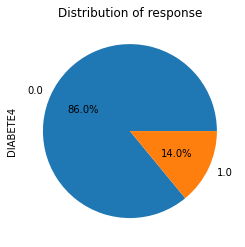

In [ ]:
diabetic_count = data['DIABETE4'].value_counts()
ax = diabetic_count.plot(kind='pie', autopct='%1.1f%%')
ax.set_title("Distribution of response")
plt.rcParams["figure.figsize"] = (10,9)

In [ ]:
# HistgradientBoosting classifier can handle the missing data
data=data.loc[data['DIABETE4'].notna()]

In [ ]:
X=data.loc[:, data.columns !='DIABETE4'] #266 columns
y=data['DIABETE4'] # 1 column

In [ ]:
X.shape

(437708, 266)

In [ ]:
y.shape

(437708,)

In [ ]:
# Splitting the data for model training
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

In [ ]:
# Get the data shape for further analysis
print("========== Training data ========== ")
print(f"Features: {X_train.shape} | Target:{y_train.shape}")
print("========== Test data ========== ")
print(f"Features: {X_test.shape} | Target:{y_test.shape}")

========== Training data ========== 
Features: (328281, 266) | Target:(328281,)
========== Test data ========== 
Features: (109427, 266) | Target:(109427,)


In [ ]:
start=time.time()
hgbm = HistGradientBoostingClassifier().fit(X_train, y_train)
stop = time.time() - start
print(stop)

41.19574952125549


In [ ]:
y_pred_hgbm=hgbm.predict(X_test)
print(f'Training Accuracy :{accuracy_score(y_train,hgbm.predict(X_train))}')
print(f'Testing Accuracy :{accuracy_score(y_test,y_pred_hgbm)}')
print(f'Recall: {recall_score(y_test,y_pred_hgbm)}')
print(f'precision: {precision_score(y_test,y_pred_hgbm)}')
print(f'F1-score: {f1_score(y_test,y_pred_hgbm)}')

Training Accuracy :0.9911143197443654
Testing Accuracy :0.9916291226114213
Recall: 0.9409885237350026
precision: 0.9992383326409084
F1-score: 0.9692390355295856


In [ ]:
# As can be seen in the response above, it took a total of ~40 secs to perform fitting on almost 75% of the training data
hgbm.score(X_test, y_test)

0.9916291226114213

In [ ]:
# Now that we understand the performance of almost whole of the data set
# HGBoost does perform really well on the huge dataset both in terms of the accuracy(96.41%) as well as the time complexity

In [ ]:
# Now we will be working on the iterative imputer using a combination of Linear Regression and RandomForest
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import LinearRegression
from sklearn import utils
imp_mean = IterativeImputer(estimator=LinearRegression(),random_state=0,n_nearest_features=10) # Consider changing n_nearest_features,estimator,


In [ ]:
pd.set_option('display.max_rows',None)

In [ ]:
# get the columns whose null value count is equal to the shape of the data
data.columns[data.isnull().sum()==data.shape[0]]

Index(['TOLDCFS', 'HAVECFS', 'WORKCFS'], dtype='object')

In [ ]:
continous = ['NUMMEN','NUMWOMEN','HHADULT','DIABAGE3','CHILDREN','WEIGHT2','HEIGHT3', 'AVEDRNK3','DRNK3GE5','MAXDRNKS','FVGREEN1','FRENCHF1','POTATOE1','VEGETAB2',
'BLDSUGAR','FEETCHK3','DOCTDIAB','CHKHEMO3','FEETCHK','LCSFIRST','LCSLAST','LCSNUMCG',
'CNCRAGE','HTM4','WTKG3','_BMI5','DROCDY3_','_DRNKWK1','FTJUDA2_','FRUTDA2_','GRENDA1_',
'FRNCHDA_' ,'POTADA1_','VEGEDA2_','_FRUTSU1','_VEGESU1']

categorical=['_STATE','FMONTH','PHYSHLTH','MENTHLTH','POORHLTH','PRIMINSR','INCOME3','ALCDAY5','FLSHTMY3','IMFVPLA2','HIVTSTD3','FRUIT2','FRUITJU2',
'CNCRTYP1','CSRVDOC1','_AGEG5YR','_PRACE1','CRGVPRB3','MARIJAN1','LASTSMK2','CNCRTYP1','CSRVDOC1']

for i in data.columns:
    if len(data[i].unique())<=10:
        categorical.append(i)
print(len(continous)+len(categorical))

268


In [ ]:


# get the type of all the categorical variables  
for i in categorical:
    if utils.multiclass.type_of_target(data[i].dropna(inplace=False))=='continuous':
        print(i)

In [ ]:
df=data.loc[:,:]
df.shape

(438690, 267)

In [ ]:
# if the number of null values = shape of the data being considered for the imputation, then the model doesn't imput any thing
# which is fact, as it doesn't have any ground truth for modelling

from sklearn.linear_model import LogisticRegression
tf = df.loc[100000:108010,categorical]
tf=tf.drop(['COLGHOUS','COLGSEX'],axis=1)
tf = tf.loc[:,tf.columns[tf.isnull().sum()!=tf.shape[0]]]
tf = tf.sample(frac=1, replace=False, random_state=4)
print(tf.shape)

# Setting the random_state argument for reproducibility
imputer = IterativeImputer(estimator=LogisticRegression(),random_state=42)
imputed = imputer.fit_transform(tf)
print(imputed.shape)
tf_imputed = pd.DataFrame(imputed, columns=tf.columns)

print(tf)
print(round(tf_imputed, 2))

(8011, 160)


C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

(8011, 160)
        _STATE  FMONTH  PHYSHLTH  MENTHLTH  POORHLTH  PRIMINSR  INCOME3  \
100753    19.0     8.0      88.0      88.0       NaN       1.0     77.0   
100930    19.0     8.0       3.0      88.0      88.0       1.0      8.0   
106771    20.0     5.0      88.0      88.0       NaN       3.0      3.0   
105616    20.0     8.0      88.0      88.0       NaN       1.0     99.0   
104352    20.0     3.0      88.0      88.0       NaN       3.0      7.0   
107851    20.0    10.0       1.0      88.0       1.0       3.0      8.0   
105601    20.0     7.0      88.0      88.0       NaN       2.0      9.0   
107427    20.0     7.0      88.0      88.0       NaN       2.0      6.0   
107868    20.0    10.0       2.0      88.0      88.0       1.0     11.0   
101488    19.0     9.0       1.0       1.0      88.0       1.0     10.0   
102270    19.0    10.0      88.0      88.0       NaN      88.0      1.0   
107041    20.0     6.0      88.0      88.0       NaN       2.0      9.0   
107077    20.

      _STATE  FMONTH  PHYSHLTH  MENTHLTH  POORHLTH  PRIMINSR  INCOME3  \
0       19.0     8.0      88.0      88.0      88.0       1.0     77.0   
1       19.0     8.0       3.0      88.0      88.0       1.0      8.0   
2       20.0     5.0      88.0      88.0      88.0       3.0      3.0   
3       20.0     8.0      88.0      88.0      88.0       1.0     99.0   
4       20.0     3.0      88.0      88.0      88.0       3.0      7.0   
5       20.0    10.0       1.0      88.0       1.0       3.0      8.0   
6       20.0     7.0      88.0      88.0      88.0       2.0      9.0   
7       20.0     7.0      88.0      88.0      88.0       2.0      6.0   
8       20.0    10.0       2.0      88.0      88.0       1.0     11.0   
9       19.0     9.0       1.0       1.0      88.0       1.0     10.0   
10      19.0    10.0      88.0      88.0      88.0      88.0      1.0   
11      20.0     6.0      88.0      88.0      88.0       2.0      9.0   
12      20.0     6.0      30.0      88.0      88.0 

In [ ]:
if set(['CNCRAGE','HTM4', '_BMI5', 'VEGEDA2_']).issubset(df.columns):
    print('exists')

exists


In [ ]:
cf = df.loc[100000:108010,continous]
cf = cf.loc[:,cf.columns[cf.isnull().sum()!=cf.shape[0]]]
cf = cf.sample(frac=1, replace=False, random_state=4)
print(type(cf))

<class 'pandas.core.frame.DataFrame'>


In [ ]:
tf_imputed.head()

,_STATE,FMONTH,PHYSHLTH,MENTHLTH,POORHLTH,PRIMINSR,INCOME3,ALCDAY5,FLSHTMY3,IMFVPLA2,...,_RFSMOK3,_CURECI1,DRNKANY5,_RFBING5,_RFDRHV7,_FLSHOT7,_PNEUMO3,_AIDTST4,_FRTLT1A,_VEGLT1A
0,19.0,8.0,88.0,88.0,88.0,1.0,77.0,202.0,102020.0,5.0,...,1.0,1.0,1.0,2.0,1.0,1.0,1.0,2.0,1.0,1.0
1,19.0,8.0,3.0,88.0,88.0,1.0,8.0,888.0,112020.0,5.0,...,1.0,1.0,2.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0
2,20.0,5.0,88.0,88.0,88.0,3.0,3.0,888.0,102020.0,2.0,...,1.0,1.0,2.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0
3,20.0,8.0,88.0,88.0,88.0,1.0,99.0,888.0,777777.0,1.0,...,1.0,1.0,2.0,1.0,1.0,1.0,1.0,2.0,9.0,1.0
4,20.0,3.0,88.0,88.0,88.0,3.0,7.0,220.0,102020.0,5.0,...,1.0,1.0,1.0,2.0,1.0,1.0,2.0,2.0,2.0,1.0


In [ ]:
tf_imputed.columns.get_loc('DIABETE4')

44

In [ ]:
tf_imputed.iloc[:20,44]

0     3.0
1     3.0
2     1.0
3     3.0
4     3.0
5     3.0
6     3.0
7     1.0
8     3.0
9     3.0
10    3.0
11    3.0
12    3.0
13    1.0
14    3.0
15    4.0
16    3.0
17    2.0
18    3.0
19    3.0
Name: DIABETE4, dtype: float64

In [ ]:
cf.reset_index(drop=True)

,NUMMEN,NUMWOMEN,HHADULT,DIABAGE3,CHILDREN,WEIGHT2,HEIGHT3,AVEDRNK3,DRNK3GE5,MAXDRNKS,...,DROCDY3_,_DRNKWK1,FTJUDA2_,FRUTDA2_,GRENDA1_,FRNCHDA_,POTADA1_,VEGEDA2_,_FRUTSU1,_VEGESU1
0,NaN,NaN,5.0,NaN,1.0,125.0,504.0,3.0,1.0,4.0,...,7.000000e+00,1.400000e+02,3.000000e+00,1.000000e+02,4.300000e+01,3.000000e+00,7.000000e+00,1.000000e+02,1.030000e+02,1.530000e+02
1,NaN,NaN,3.0,NaN,2.0,270.0,509.0,NaN,NaN,NaN,...,5.397605e-79,5.397605e-79,4.300000e+01,1.000000e+02,2.900000e+01,7.100000e+01,2.900000e+01,5.700000e+01,1.430000e+02,1.860000e+02
2,NaN,NaN,NaN,98.0,88.0,215.0,503.0,NaN,NaN,NaN,...,5.397605e-79,5.397605e-79,5.397605e-79,5.000000e+01,1.000000e+02,5.397605e-79,1.300000e+01,1.000000e+02,5.000000e+01,2.130000e+02
3,1.000000e+00,1.000000e+00,NaN,NaN,1.0,9999.0,504.0,NaN,NaN,NaN,...,5.397605e-79,5.397605e-79,5.397605e-79,NaN,2.900000e+01,2.900000e+01,2.900000e+01,2.900000e+01,NaN,1.160000e+02
4,NaN,NaN,NaN,NaN,88.0,147.0,504.0,1.0,2.0,4.0,...,6.700000e+01,4.670000e+02,5.397605e-79,7.000000e+00,8.300000e+01,7.000000e+00,3.000000e+00,1.000000e+02,7.000000e+00,1.930000e+02
5,NaN,NaN,NaN,NaN,88.0,145.0,504.0,2.0,88.0,2.0,...,8.300000e+01,1.167000e+03,5.397605e-79,NaN,7.100000e+01,7.000000e+00,4.300000e+01,1.000000e+02,NaN,2.210000e+02
6,NaN,NaN,NaN,NaN,88.0,155.0,509.0,2.0,88.0,2.0,...,7.000000e+00,9.300000e+01,3.000000e+00,4.300000e+01,4.300000e+01,5.397605e-79,4.300000e+01,5.700000e+01,4.600000e+01,1.430000e+02
7,1.000000e+00,1.000000e+00,NaN,7.0,88.0,172.0,602.0,NaN,NaN,NaN,...,5.397605e-79,5.397605e-79,5.397605e-79,2.000000e+02,2.000000e+02,5.397605e-79,5.397605e-79,1.000000e+02,2.000000e+02,3.000000e+02
8,NaN,NaN,NaN,NaN,88.0,172.0,509.0,4.0,6.0,10.0,...,1.000000e+02,2.800000e+03,2.900000e+01,5.700000e+01,1.400000e+01,2.900000e+01,2.900000e+01,1.400000e+01,8.600000e+01,8.600000e+01
9,NaN,NaN,3.0,NaN,2.0,265.0,510.0,3.0,1.0,6.0,...,5.000000e+01,1.050000e+03,3.000000e+00,2.900000e+01,3.300000e+01,1.700000e+01,1.700000e+01,6.700000e+01,3.200000e+01,1.340000e+02


In [ ]:
# Concatenate both categorical and continous variables together and send it to perform imputation using linear regression 
final=pd.DataFrame(np.hstack([tf_imputed,cf]))

In [ ]:
f=pd.concat([tf_imputed,cf],axis=1,ignore_index=True)

In [ ]:
tf_imputed.shape,cf.shape

((8011, 160), (8011, 32))

In [ ]:
f.shape

(16022, 192)

In [ ]:
imputer = IterativeImputer(estimator=LinearRegression(),random_state=42)
final_imputed = imputer.fit_transform(final)
print(final_imputed.shape)
tf_imputed = pd.DataFrame(final_imputed, columns=final.columns)

print(final_imputed)

(8011, 192)
[[ 19.   8.  88. ... 100. 103. 153.]
 [ 19.   8.   3. ...  57. 143. 186.]
 [ 20.   5.  88. ... 100.  50. 213.]
 ...
 [ 19.  11.  88. ... 100. 114. 186.]
 [ 19.   7.   3. ...   3.  32.  92.]
 [ 19.   8.   2. ... 200.  57. 314.]]


C:\Users\Sanjay\anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


In [ ]:
abc=pd.DataFrame(final_imputed, columns=final.columns)

In [ ]:
abc.to_csv('Iterative_imputed_8011_192.csv')

In [ ]:
abc.columns

RangeIndex(start=0, stop=192, step=1)

In [ ]:
for i in tf.columns:
    if len(tf[i].unique())==2:
        print(i,tf[i].unique())

_STATE [19. 20.]
DISPCODE [1200. 1100.]
SEXVAR [2. 1.]
QSTLANG [1. 2.]
_METSTAT [1. 2.]
_URBSTAT [1. 2.]
_SEX [2. 1.]


In [ ]:
# Difficulty in judging which of them is categorical 
Iterative_imputed_data=pd.read_csv('Iterative_imputed_8011_192.csv')
Iterative_imputed_data.head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,182,183,184,185,186,187,188,189,190,191
0,0,19.0,8.0,88.0,88.0,88.0,1.0,77.0,202.0,102020.0,...,7.000000e+00,1.400000e+02,3.000000e+00,100.000000,43.0,3.000000e+00,7.0,100.0,103.000000,153.0
1,1,19.0,8.0,3.0,88.0,88.0,1.0,8.0,888.0,112020.0,...,5.397605e-79,5.397605e-79,4.300000e+01,100.000000,29.0,7.100000e+01,29.0,57.0,143.000000,186.0
2,2,20.0,5.0,88.0,88.0,88.0,3.0,3.0,888.0,102020.0,...,5.397605e-79,5.397605e-79,5.397605e-79,50.000000,100.0,5.397605e-79,13.0,100.0,50.000000,213.0
3,3,20.0,8.0,88.0,88.0,88.0,1.0,99.0,888.0,777777.0,...,5.397605e-79,5.397605e-79,5.397605e-79,128.182009,29.0,2.900000e+01,29.0,29.0,128.182009,116.0
4,4,20.0,3.0,88.0,88.0,88.0,3.0,7.0,220.0,102020.0,...,6.700000e+01,4.670000e+02,5.397605e-79,7.000000,83.0,7.000000e+00,3.0,100.0,7.000000,193.0


In [ ]:
Iterative_imputed_data.drop('Unnamed: 0',axis=1,inplace=True)

In [ ]:
Iterative_imputed_data=Iterative_imputed_data[Iterative_imputed_data['44']!=7.0]

In [ ]:
Iterative_imputed_data=Iterative_imputed_data[Iterative_imputed_data['44']!=9.0]

In [ ]:
Iterative_imputed_data['44']

0       3.0
1       3.0
2       1.0
3       3.0
4       3.0
5       3.0
6       3.0
7       1.0
8       3.0
9       3.0
10      3.0
11      3.0
12      3.0
13      1.0
14      3.0
15      4.0
16      3.0
17      2.0
18      3.0
19      3.0
20      3.0
21      3.0
22      1.0
23      3.0
24      3.0
25      3.0
26      3.0
27      3.0
28      3.0
29      3.0
30      3.0
31      1.0
32      3.0
33      3.0
34      3.0
35      3.0
36      3.0
37      3.0
38      3.0
39      3.0
40      1.0
41      3.0
42      1.0
43      3.0
44      3.0
45      3.0
46      1.0
47      3.0
48      3.0
49      3.0
50      3.0
51      3.0
52      3.0
53      3.0
54      3.0
55      3.0
56      3.0
57      3.0
58      3.0
59      3.0
60      3.0
61      3.0
62      3.0
63      3.0
64      3.0
65      3.0
66      3.0
67      3.0
68      3.0
69      3.0
70      3.0
71      3.0
72      3.0
73      3.0
74      3.0
75      3.0
76      3.0
77      3.0
78      3.0
79      1.0
80      1.0
81      3.0
82      3.0
83  

In [ ]:
Iterative_imputed_data['44'].replace([2,3,4], [1, 0, 0],inplace=True)

In [ ]:
y=Iterative_imputed_data.loc[:,'44']

In [ ]:
X=Iterative_imputed_data.loc[:,Iterative_imputed_data.columns!='44']

In [ ]:
X.shape

(7996, 191)

In [ ]:
y.shape

(7996,)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

In [ ]:
# Running Logistic regression on the imputed data
LogReg=LogisticRegression(multi_class='multinomial',random_state=0).fit(X_train, y_train)

In [ ]:
LogReg.score(X_test,y_test)

0.8404202101050525

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score, precision_score,confusion_matrix, recall_score

models={
    'LR':LogisticRegression(),
    'RT':RandomForestClassifier()
}


In [ ]:
for name,model in  models.items():
    print(f'using {name}: ')
    model.fit(X_train,y_train)
    y_pred=model.predict(X_test)
    print(f'Testing Accuracy :{accuracy_score(y_test,y_pred)}')
    print(f'Confusion matrix:\n {confusion_matrix(y_test,y_pred)}')
    print(f'Recall: {recall_score(y_test,y_pred)}')
    print(f'precision: {precision_score(y_test,y_pred)}')
    print(f'F1-score: {f1_score(y_test,y_pred)}')


using LR: 
Testing Accuracy :0.8404202101050525
Confusion matrix:
 [[1645   38]
 [ 281   35]]
Recall: 0.11075949367088607
precision: 0.4794520547945205
F1-score: 0.17994858611825193
using RT: 
Testing Accuracy :0.9324662331165583
Confusion matrix:
 [[1673   10]
 [ 125  191]]
Recall: 0.6044303797468354
precision: 0.9502487562189055
F1-score: 0.7388781431334621
